In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/higgs-boson/training.zip
/kaggle/input/higgs-boson/HiggsBosonCompetition_AMSMetric_rev1.py
/kaggle/input/higgs-boson/random_submission.zip
/kaggle/input/higgs-boson/test.zip


# **Pre-requisites:**

In [ ]:
!curl https://raw.githubusercontent.com/automl/auto-sklearn/master/requirements.txt | xargs -n 1 -L 1 pip install
!pip install auto-sklearn

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   209  100   209    0     0    438      0 --:--:-- --:--:-- --:--:--   438
  Created wheel for liac-arff: filename=liac_arff-2.5.0-py3-none-any.whl size=11731 sha256=becd205c1d279f4edf9f89d8634c0ada4ab078fa4606e6ca7d3296e6c31ee084
  Stored in directory: /root/.cache/pip/wheels/1f/0f/15/332ca86cbebf25ddf98518caaf887945fbe1712b97a0f2493b
Successfully built liac-arff
  Created wheel for pynisher: filename=pynisher-0.6.4-py3-none-any.whl size=7043 sha256=c15021fd25938c8fcd4b9f392489f762272fb5087e36f7a8b8b3fb7ea41a2e2e
  Stored in directory: /root/.cache/pip/wheels/42/71/95/7555ec3253e1ba8add72ae5febf1b015d297f3b73ba296d6f6
Successfully built pynisher
     |████████████████████████████████| 4.0 MB 1.3 MB/s eta 0:00:01
     |████████████████████████████████| 258 kB 1.3 MB/s eta 0:00:01
  Created wheel for smac: filename=smac-0.13.1-

In [ ]:
!pip install dtreeviz
from dtreeviz.trees import dtreeviz

     |████████████████████████████████| 60 kB 881 kB/s eta 0:00:01
  Created wheel for dtreeviz: filename=dtreeviz-1.3-py3-none-any.whl size=66638 sha256=e755a910f76d28f1dd6a514693dc0850813e41df8e810b0de694ca770963fe81
  Stored in directory: /root/.cache/pip/wheels/9f/a6/a1/898c991294471015f13c1e5b456fb8134c1af835db4dd93a7a
Successfully built dtreeviz
  Attempting uninstall: graphviz
    Found existing installation: graphviz 0.8.4
    Uninstalling graphviz-0.8.4:
      Successfully uninstalled graphviz-0.8.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
mxnet 1.8.0.post0 requires graphviz<0.9.0,>=0.8.1, but you have graphviz 0.16 which is incompatible.
autogluon-core 0.1.0 requires graphviz<0.9.0,>=0.8.1, but you have graphviz 0.16 which is incompatible.


In [ ]:

!pip install -U rfpimp
!pip install -U imbalanced-learn
%matplotlib inline
#importing libraries
import numpy as np
import scipy.stats
import scipy.special
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
from matplotlib import cm
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import log_loss
from sklearn.metrics import mean_absolute_error
from sklearn.pipeline import make_pipeline, make_union, Pipeline
from sklearn.preprocessing import StandardScaler, OrdinalEncoder
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import ParameterGrid
from keras.models import Sequential
from keras.models import Model as KerasModel
from keras.layers import Input, Dense, Activation, Reshape
from keras.layers import Concatenate
from keras.layers.embeddings import Embedding
from sklearn.ensemble import RandomForestRegressor
from sklearn import linear_model
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.inspection import permutation_importance
import pickle
import csv
import collections
from rfpimp import *
from rfpimp import plot_corr_heatmap
from datetime import datetime
from sklearn import preprocessing
from keras.callbacks import ModelCheckpoint
import xgboost as xgb
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import classification_report
import seaborn as sns
import imblearn
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from sklearn.metrics import make_scorer
from sklearn.metrics import plot_confusion_matrix
import math
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve, auc

# Datasets:

In [ ]:
training=pd.read_csv("/kaggle/input/higgs-boson/training.zip")
training.head()

,EventId,DER_mass_MMC,DER_mass_transverse_met_lep,DER_mass_vis,DER_pt_h,DER_deltaeta_jet_jet,DER_mass_jet_jet,DER_prodeta_jet_jet,DER_deltar_tau_lep,DER_pt_tot,...,PRI_jet_num,PRI_jet_leading_pt,PRI_jet_leading_eta,PRI_jet_leading_phi,PRI_jet_subleading_pt,PRI_jet_subleading_eta,PRI_jet_subleading_phi,PRI_jet_all_pt,Weight,Label
0,100000,138.470,51.655,97.827,27.980,0.91,124.711,2.666,3.064,41.928,...,2,67.435,2.150,0.444,46.062,1.24,-2.475,113.497,0.002653,s
1,100001,160.937,68.768,103.235,48.146,-999.00,-999.000,-999.000,3.473,2.078,...,1,46.226,0.725,1.158,-999.000,-999.00,-999.000,46.226,2.233584,b
2,100002,-999.000,162.172,125.953,35.635,-999.00,-999.000,-999.000,3.148,9.336,...,1,44.251,2.053,-2.028,-999.000,-999.00,-999.000,44.251,2.347389,b
3,100003,143.905,81.417,80.943,0.414,-999.00,-999.000,-999.000,3.310,0.414,...,0,-999.000,-999.000,-999.000,-999.000,-999.00,-999.000,-0.000,5.446378,b
4,100004,175.864,16.915,134.805,16.405,-999.00,-999.000,-999.000,3.891,16.405,...,0,-999.000,-999.000,-999.000,-999.000,-999.00,-999.000,0.000,6.245333,b


In [ ]:
testing=pd.read_csv("/kaggle/input/higgs-boson/test.zip")
testing.set_index('EventId',inplace=True)
testing.head()

,DER_mass_MMC,DER_mass_transverse_met_lep,DER_mass_vis,DER_pt_h,DER_deltaeta_jet_jet,DER_mass_jet_jet,DER_prodeta_jet_jet,DER_deltar_tau_lep,DER_pt_tot,DER_sum_pt,...,PRI_met_phi,PRI_met_sumet,PRI_jet_num,PRI_jet_leading_pt,PRI_jet_leading_eta,PRI_jet_leading_phi,PRI_jet_subleading_pt,PRI_jet_subleading_eta,PRI_jet_subleading_phi,PRI_jet_all_pt
EventId,,,,,,,,,,,,,,,,,,,,,
350000,-999.000,79.589,23.916,3.036,-999.000,-999.000,-999.000,0.903,3.036,56.018,...,2.022,98.556,0,-999.000,-999.000,-999.000,-999.000,-999.000,-999.000,-0.000
350001,106.398,67.490,87.949,49.994,-999.000,-999.000,-999.000,2.048,2.679,132.865,...,-1.138,176.251,1,47.575,-0.553,-0.849,-999.000,-999.000,-999.000,47.575
350002,117.794,56.226,96.358,4.137,-999.000,-999.000,-999.000,2.755,4.137,97.600,...,-1.868,111.505,0,-999.000,-999.000,-999.000,-999.000,-999.000,-999.000,0.000
350003,135.861,30.604,97.288,9.104,-999.000,-999.000,-999.000,2.811,9.104,94.112,...,1.172,164.707,0,-999.000,-999.000,-999.000,-999.000,-999.000,-999.000,0.000
350004,74.159,82.772,58.731,89.646,1.347,536.663,-0.339,1.028,77.213,721.552,...,-0.231,869.614,3,254.085,-1.013,-0.334,185.857,0.335,2.587,599.213


*Here, we have the two datasets of the Higg Boson Challenge of 2014 which had the data for categorising the events as either a signal event or a background event. The accuracy of the classification model is to be calculated using the approximate median significance. The weights of each of the cases are also given.*

In [ ]:
print(training.shape,testing.shape)

(250000, 33) (550000, 30)


In [ ]:
train_dataX=training.drop(["Weight","Label"],axis=1)
train_dataX.set_index('EventId',inplace=True)
train_dataY=training['Label']


In [ ]:
train_dataY=pd.factorize(train_dataY)[0]

In [ ]:
from IPython.display import display, HTML

def pretty_print(df):
    return display( HTML( df.to_html().replace("\\n","<br>") ) )
def tbl_report(tbl, cols=None, card=10):
    print("Table Shape", tbl.shape)
    dtypes = tbl.dtypes
    nulls = []
    uniques = []
    numuniques = []
    vcs = []
    for col in dtypes.index:
        n = tbl[col].isnull().sum()
        nulls.append(n)
        strdtcol = str(dtypes[col])
        #if strdtcol == 'object' or strdtcol[0:3] == 'int' or strdtcol[0:3] == 'int':
        #print(strdtcol)
        uniqs = tbl[col].unique()
        uniquenums = uniqs.shape[0]
        if uniquenums < card: # low cardinality
            valcounts = pd.value_counts(tbl[col], dropna=False)
            vc = "\n".join(["{}:{}".format(k,v) for k, v in valcounts.items()])
        else:
            vc='HC' # high cardinality
        uniques.append(uniqs)
        numuniques.append(uniquenums)
        vcs.append(vc)
    nullseries = pd.Series(nulls, index=dtypes.index)
    uniqueseries = pd.Series(uniques, index=dtypes.index)
    numuniqueseries = pd.Series(numuniques, index=dtypes.index)
    vcseries = pd.Series(vcs, index=dtypes.index)
    df = pd.concat([dtypes, nullseries, uniqueseries, numuniqueseries, vcseries], axis=1)
    df.columns = ['dtype', 'nulls', 'uniques', 'num_uniques', 'value_counts']
    if cols:
        return pretty_print(df[cols])
    return pretty_print(df)

**We will have a look at our training dataset before we run any EDA,Feature Engineering or Modelling**

In [ ]:
tbl_report(train_dataX)

Table Shape (250000, 30)


,dtype,nulls,uniques,num_uniques,value_counts
DER_mass_MMC,float64,0,"[138.47, 160.937, -999.0, 143.905, 175.864, 89.744, 148.754, 154.916, 105.594, 128.053, 114.744, 145.297, 82.488, 111.026, 114.256, 127.861, 90.736, 87.075, 141.481, 110.785, 76.883, 137.197, 111.271, 118.104, 98.761, 121.681, 129.186, 123.112, 156.894, 72.712, 134.153, 155.487, 138.362, 120.506, 109.684, 90.833, 122.516, 132.049, 84.86, 27.788, 201.473, 130.079, 167.534, 95.407, 219.057, 104.142, 219.292, 51.025, 148.523, 104.221, 73.819, 103.646, 122.934, 139.394, 92.065, 92.696, 83.081, 123.715, 94.229, 88.532, 101.675, 120.253, 96.906, 92.222, 98.597, 239.551, 86.629, 132.35, 123.29, 84.608, 166.64, 145.99, 99.668, 199.9, 92.079, 117.247, 235.976, 151.45, 124.118, 96.97, 96.379, 111.356, 98.181, 113.75, 124.575, 77.578, 107.35, 90.801, 95.787, 101.079, 130.123, 130.634, 208.573, 91.616, 109.829, 90.331, 114.661, 139.756, 87.523, 287.995, ...]",108338,HC
DER_mass_transverse_met_lep,float64,0,"[51.655, 68.768, 162.172, 81.417, 16.915, 13.55, 28.862, 10.418, 50.559, 88.941, 86.24, 10.286, 64.234, 31.663, 109.412, 32.096, 4.351, 50.953, 85.186, 88.767, 89.705, 18.674, 38.217, 0.736, 72.927, 34.384, 68.009, 27.18, 2.633, 14.024, 91.316, 6.041, 64.045, 62.758, 39.256, 20.762, 23.856, 61.072, 38.034, 22.729, 42.664, 62.236, 50.183, 65.682, 33.706, 68.032, 23.002, 53.335, 41.277, 21.584, 72.461, 37.94, 83.924, 98.947, 74.6, 50.315, 110.686, 31.911, 13.816, 83.737, 40.918, 73.141, 71.611, 65.274, 51.669, 63.334, 57.088, 78.683, 16.345, 72.911, 30.144, 70.619, 71.751, 16.05, 65.71, 41.715, 118.683, 33.856, 65.858, 52.954, 50.05, 65.312, 15.868, 68.862, 25.986, 71.692, 78.686, 42.327, 102.167, 55.918, 39.326, 59.132, 61.769, 17.118, 20.265, 68.298, 52.067, 34.558, 72.277, 20.354, ...]",101637,HC
DER_mass_vis,float64,0,"[97.827, 103.235, 125.953, 80.943, 134.805, 59.149, 107.782, 94.714, 100.989, 69.272, 79.692, 75.712, 103.565, 64.128, 14.398, 75.271, 67.963, 77.267, 68.827, 115.058, 41.765, 60.231, 67.041, 111.581, 82.775, 56.993, 78.296, 70.642, 77.31, 74.23, 51.771, 73.202, 69.499, 86.702, 122.894, 50.255, 100.96, 125.013, 99.038, 88.889, 86.064, 53.228, 87.682, 87.937, 67.847, 23.53, 104.041, 97.435, 123.308, 67.766, 124.835, 69.029, 136.152, 85.408, 177.143, 46.006, 65.448, 97.497, 71.225, 60.659, 64.244, 68.069, 78.711, 53.52, 68.835, 60.631, 81.811, 69.352, 50.14, 49.453, 82.176, 81.224, 74.602, 64.769, 56.525, 78.618, 193.111, 67.5, 106.57, 76.946, 63.451, 50.047, 80.477, 97.342, 60.637, 52.779, 167.085, 71.28, 79.738, 175.744, 108.268, 77.775, 93.213, 63.373, 50.19, 77.216, 76.262, 100.197, 58.168, 77.755, ...]",100558,HC
DER_pt_h,float64,0,"[27.98, 48.146, 35.635, 0.414, 16.405, 116.344, 106.13, 29.169, 4.288, 193.392, 27.201, 30.816, 106.999, 8.232, 17.323, 23.067, 47.221, 26.967, 5.042, 15.337, 18.437, 25.156, 2.347, 174.075, 30.888, 5.569, 35.332, 144.766, 91.388, 132.806, 33.742, 198.114, 63.165, 39.901, 71.682, 39.263, 9.377, 2.768, 65.021, 35.999, 0.23, 21.581, 102.403, 0.861, 18.079, 33.375, 60.49, 1.382, 9.909, 1.482, 5.506, 50.58, 40.286, 1.578, 2.423, 1.303, 49.395, 171.074, 27.029, 43.435, 135.726, 4.647, 28.947, 28.173, 39.384, 38.653, 53.612, 25.679, 95.309, 42.633, 38.736, 23.097, 39.664, 3.422, 1.118, 3.375, 6.549, 49.081, 124.84, 129.157, 0.658, 0.515, 77.915, 28.538, 192.267, 2.705, 77.236, 29.118, 34.164, 39.662, 19.727, 0.419, 0.51, 71.039, 104.878, 1.17, 1.25, 161.051, 153.606, 89.044, ...]",115563,HC
DER_deltaeta_jet_jet,float64,0,"[0.91, -999.0, 2.636, 0.733, 2.563, 1.955, 4.936, 3.676, 2.639, 5.087, 3.16, 1.814, 0.218, 3.28, 1.37, 4.437, 3.941, 0.482, 1.209, 1.494, 0.68, 4.557, 3.918, 2.978, 5.822, 1.575, 4.664, 1.048, 0.726, 6.108, 3.243, 2.604, 4.449, 0.237, 2.463, 3.022, 2.685, 3.655, 2.893, 4.868, 0.313, 4.023, 0.69, 0.698, 4.761, 0.006, 2.594, 0.9, 5.762, 3.015, 0.833, 0.191, 0.718, 0.918, 1.441, 0.019, 4.261, 4.297, 2.675, 0.463, 1.127, 0.617, 0.065, 4.035, 0.441, 0.916, 3.66, 2.541, 0.647, 3.342, 3.483, 0.661, 1.124, 3.384, 0

Our dataset has one categorical variable and rest all continuous variable.

In [ ]:
cat_vars=['PRI_jet_num']
cont_vars=np.array(train_dataX.drop('PRI_jet_num',axis=1).columns)

In [ ]:
cont_vars

array(['DER_mass_MMC', 'DER_mass_transverse_met_lep', 'DER_mass_vis',
       'DER_pt_h', 'DER_deltaeta_jet_jet', 'DER_mass_jet_jet',
       'DER_prodeta_jet_jet', 'DER_deltar_tau_lep', 'DER_pt_tot',
       'DER_sum_pt', 'DER_pt_ratio_lep_tau', 'DER_met_phi_centrality',
       'DER_lep_eta_centrality', 'PRI_tau_pt', 'PRI_tau_eta',
       'PRI_tau_phi', 'PRI_lep_pt', 'PRI_lep_eta', 'PRI_lep_phi',
       'PRI_met', 'PRI_met_phi', 'PRI_met_sumet', 'PRI_jet_leading_pt',
       'PRI_jet_leading_eta', 'PRI_jet_leading_phi',
       'PRI_jet_subleading_pt', 'PRI_jet_subleading_eta',
       'PRI_jet_subleading_phi', 'PRI_jet_all_pt'], dtype=object)

# Models:

#### Helper Function:

In [ ]:
def cv_optimize(clf, parameters, X, y, n_jobs=1, n_folds=5, score_func=None):
    if score_func:
        print("SCORE FUNC", score_func)
        gs = GridSearchCV(clf, param_grid=parameters, cv=n_folds, n_jobs=n_jobs, scoring=score_func)
    else:
        gs = GridSearchCV(clf, param_grid=parameters, n_jobs=n_jobs, cv=n_folds)
    gs.fit(X, y)
    print("BEST", gs.best_params_, gs.best_score_)
    best = gs.best_estimator_
    return best
def do_classify(clf, parameters, indf,y,score_func, n_folds=5, n_jobs=1):
    X=indf
    y=y
    Xtrain,Xtest,ytrain,ytest=train_test_split(X,y,train_size=0.8,random_state=2017)
    clf = cv_optimize(clf, parameters, Xtrain, ytrain, n_jobs=n_jobs, n_folds=n_folds, score_func=score_func)
    clf=clf.fit(Xtrain, ytrain)
    training_accuracy = clf.score(Xtrain, ytrain)
    test_accuracy = clf.score(Xtest, ytest)
    print("############# based on standard predict ################")
    print("Accuracy on training data: %0.2f" % (training_accuracy))
    print("Accuracy on test data:     %0.2f" % (test_accuracy))
    print(confusion_matrix(ytest, clf.predict(Xtest)))
    print("########################################################")
    plot_confusion_matrix(clf,Xtest,ytest,cmap="Blues")
    return clf, Xtrain, ytrain, Xtest,ytest

### Baseline Model using LogisticRegression:

SCORE FUNC roc_auc
BEST {'model__C': 1000} 0.8155798531300317
############# based on standard predict ################
Accuracy on training data: 0.75
Accuracy on test data:     0.75
[[ 9199  7900]
 [ 4508 28393]]
########################################################


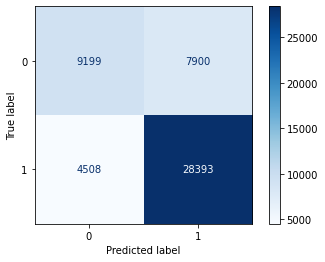

In [ ]:
# set up standardization
ss = StandardScaler()
# oe hot encoding
oh = OneHotEncoder()
# continuous variables need to be standardized
cont_pipe = Pipeline([("scale", ss)])
# categorical variables need to be one hot encoded
cat_pipe = Pipeline([('onehot', oh)])
# combine both into a transformer
transformers = [('cont', cont_pipe, cont_vars), ('cat', cat_pipe, cat_vars)]
# apply transformer to relevant columns. Nothing will be done for the rest
ct = ColumnTransformer(transformers=transformers, remainder="passthrough")
# create a pipeline so that we are not leaking data from validation to train in the individual folds
pipe = Pipeline(steps=[('ct', ct), ('model', LogisticRegression(max_iter=10000, penalty='l2'))])
# in paramgrid we dont use C but use model__C corresponding to the name in the pipeline
paramgrid = dict(model__C=[1000, 100, 10, 1, 0.1, 0.01, 0.001])

lr,Xtrain,ytrain,Xtest,ytest=do_classify(pipe, paramgrid,train_dataX, 
                              train_dataY, 
                              score_func='roc_auc')

In [ ]:
print(classification_report(ytest,lr.predict(Xtest)))

              precision    recall  f1-score   support

           0       0.67      0.54      0.60     17099
           1       0.78      0.86      0.82     32901

    accuracy                           0.75     50000
   macro avg       0.73      0.70      0.71     50000
weighted avg       0.74      0.75      0.74     50000



*The imbalance is causing the accuracy issue for predicting the the signal event. Hence, we will balance the dataset by upsampling and downsampling.*

### Upsampling and DownSampling:

In [ ]:
over = SMOTE(sampling_strategy='auto', k_neighbors=2)
under = RandomUnderSampler(sampling_strategy='auto')
steps = [('o', over), ('u', under)]
pipeline = imblearn.pipeline.Pipeline(steps=steps)
X, y = pipeline.fit_resample(train_dataX,train_dataY)
counter = collections.Counter(y)
print(counter)

Counter({0: 164333, 1: 164333})


### Baseline Model using Decision Tree Classifier:

In [ ]:
!pip install dtreeviz
from dtreeviz.trees import dtreeviz

     |████████████████████████████████| 60 kB 313 kB/s eta 0:00:01
  Created wheel for dtreeviz: filename=dtreeviz-1.3-py3-none-any.whl size=66638 sha256=cb0893569f2da04823aa67952fc1b177dea0d6570fa1f967f9bc0ac13a35726b
  Stored in directory: /root/.cache/pip/wheels/9f/a6/a1/898c991294471015f13c1e5b456fb8134c1af835db4dd93a7a
Successfully built dtreeviz
  Attempting uninstall: graphviz
    Found existing installation: graphviz 0.8.4
    Uninstalling graphviz-0.8.4:
      Successfully uninstalled graphviz-0.8.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
mxnet 1.8.0.post0 requires graphviz<0.9.0,>=0.8.1, but you have graphviz 0.16 which is incompatible.
autogluon-core 0.1.0 requires graphviz<0.9.0,>=0.8.1, but you have graphviz 0.16 which is incompatible.


SCORE FUNC accuracy
BEST {'criterion': 'gini', 'max_depth': 8, 'min_samples_leaf': 3} 0.8184049999999999
############# based on standard predict ################
Accuracy on training data: 0.83
Accuracy on test data:     0.82
[[12219  4880]
 [ 4204 28697]]
########################################################


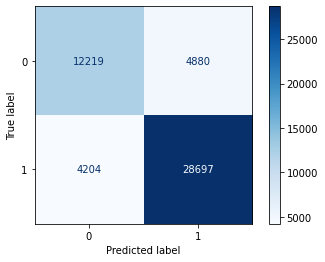

In [ ]:
clf=DecisionTreeClassifier(random_state=2017)
parameters={'max_depth':range(1,9),'min_samples_leaf':range(3,5),'criterion':['gini']}
clf, Xtrain, ytrain, Xtest,ytest=do_classify(clf, parameters,train_dataX,train_dataY,'roc_auc',n_folds=5,n_jobs=-1)

In [ ]:
print(classification_report(ytest,clf.predict(Xtest)))

              precision    recall  f1-score   support

           0       0.74      0.71      0.73     17099
           1       0.85      0.87      0.86     32901

    accuracy                           0.82     50000
   macro avg       0.80      0.79      0.80     50000
weighted avg       0.82      0.82      0.82     50000



In [ ]:
colors = [None,  # 0 classes
          None,  # 1 class
          ['#FFF4E5','#D2E3EF'],# 2 classes
           ]
vizA = dtreeviz(clf, train_dataX,train_dataY,
               feature_names = train_dataX.columns,
               target_name = 'Label', class_names= ['No','Yes']
              ,orientation = 'TD',
               colors={'classes':colors},
               label_fontsize=14,
               ticks_fontsize=10,
               )
vizA

In [ ]:
vizA.save('tree.svg')

**Although the dataset is imbalanced,the decision tree seems to do a decent job wrt to handling the imbalance**

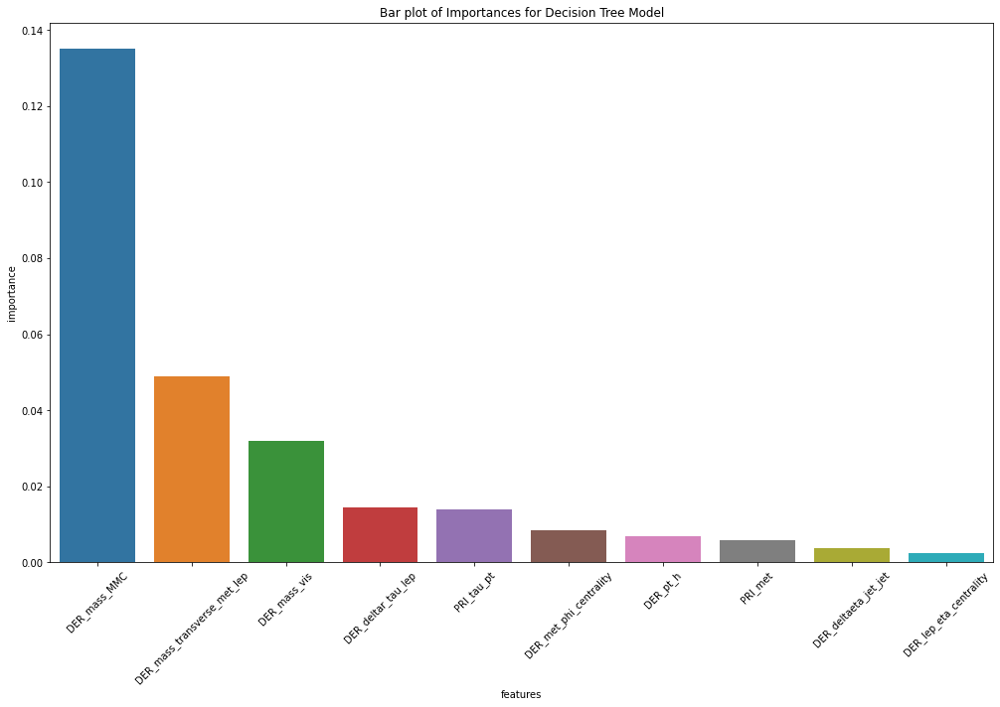

In [ ]:

def p_importance(model, cols, fi, fistd = 0):
    return pd.DataFrame({'features':cols, 'importance':fi, 'importance_std': fistd}
                       ).sort_values('importance', ascending=False)
dimp=permutation_importance(clf,Xtest,ytest)
ddf=p_importance(clf,list(train_dataX.columns),dimp['importances_mean'],dimp['importances_std']).iloc[:10]
fig,ax=plt.subplots(figsize=(17,10))
sns.barplot(data=ddf,x='features',y='importance',label='Decision_importances',ax=ax)
plt.xticks(rotation='45')
plt.title("Bar plot of Importances for Decision Tree Model");

In [ ]:
D = D['Dependence'].sort_values(ascending=False)
D

DER_lep_eta_centrality              1.0
DER_deltaeta_jet_jet                1.0
PRI_jet_subleading_eta              1.0
DER_prodeta_jet_jet                 1.0
PRI_jet_subleading_phi         0.999997
PRI_jet_leading_phi            0.999996
PRI_jet_leading_eta            0.999995
PRI_jet_subleading_pt          0.999692
PRI_jet_leading_pt             0.999494
DER_mass_jet_jet               0.995455
DER_pt_ratio_lep_tau           0.990266
DER_sum_pt                     0.983994
PRI_jet_all_pt                 0.982341
PRI_jet_num                      0.9688
PRI_lep_pt                     0.958742
DER_pt_h                       0.939628
PRI_tau_pt                     0.924911
DER_deltar_tau_lep             0.923446
PRI_met                        0.860761
PRI_met_sumet                  0.843662
DER_mass_vis                   0.795545
DER_mass_MMC                   0.768855
DER_mass_transverse_met_lep    0.734736
DER_met_phi_centrality         0.644303
PRI_lep_phi                    0.586528


**we see in the dependences and importance plots, the most dependent variables are the least important amongst the top 10 as well.**

In [ ]:
##taking only those features which are important
features=['DER_mass_MMC','DER_mass_transverse_met_lep','DER_mass_vis','DER_deltar_tau_lep','PRI_tau_pt','DER_met_phi_centrality','DER_pt_h','PRI_met']

SCORE FUNC accuracy
BEST {'criterion': 'gini', 'max_depth': 8, 'min_samples_leaf': 3} 0.8079465384882283
############# based on standard predict ################
Accuracy on training data: 0.81
Accuracy on test data:     0.81
[[26783  6018]
 [ 6606 26327]]
########################################################


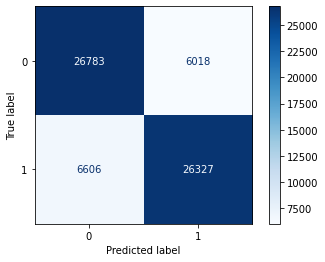

In [ ]:
clf=DecisionTreeClassifier(random_state=2017)
parameters={'max_depth':range(1,9),'min_samples_leaf':range(3,5),'criterion':['gini']}
clf, Xtrain, ytrain, Xtest,ytest=do_classify(clf, parameters,X[features],y,'roc_auc',n_folds=5,n_jobs=-1)

In [ ]:
print(classification_report(ytest,clf.predict(Xtest)))

              precision    recall  f1-score   support

           0       0.80      0.82      0.81     32801
           1       0.81      0.80      0.81     32933

    accuracy                           0.81     65734
   macro avg       0.81      0.81      0.81     65734
weighted avg       0.81      0.81      0.81     65734



In [ ]:
colors = [None,  # 0 classes
          None,  # 1 class
          ['#FFF4E5','#D2E3EF'],# 2 classes
           ]
vizb = dtreeviz(clf, Xtest[features],ytest,
               feature_names = X[features].columns,
               target_name = 'Label', class_names= ['No','Yes']
              ,orientation = 'TD',
               colors={'classes':colors},
               label_fontsize=14,
               ticks_fontsize=10,
               )
vizb

In [ ]:
vizb.save('tree2.svg')

### Random Forest Classifier:

SCORE FUNC roc_auc
BEST {'max_depth': 5, 'max_features': 3, 'n_estimators': 400} 0.8802151749628567
############# based on standard predict ################
Accuracy on training data: 0.81
Accuracy on test data:     0.81
[[11873  5226]
 [ 4081 28820]]
########################################################


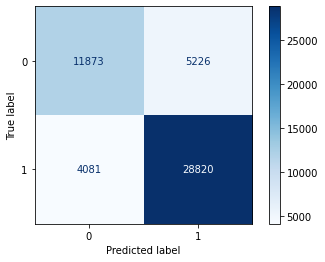

In [ ]:
clf2=RandomForestClassifier(random_state=2017)
parameters={"n_estimators":[400],'max_features':[3],'max_depth':[5]}
clf2, Xtrain, ytrain, Xtest, ytest  = do_classify(clf2, 
   parameters,train_dataX[features],train_dataY,"roc_auc", n_folds=5, n_jobs=1)

In [ ]:
print(classification_report(ytest,clf2.predict(Xtest)))

              precision    recall  f1-score   support

           0       0.74      0.69      0.72     17099
           1       0.85      0.88      0.86     32901

    accuracy                           0.81     50000
   macro avg       0.80      0.79      0.79     50000
weighted avg       0.81      0.81      0.81     50000



*We do the same now with the balanced dataset.*

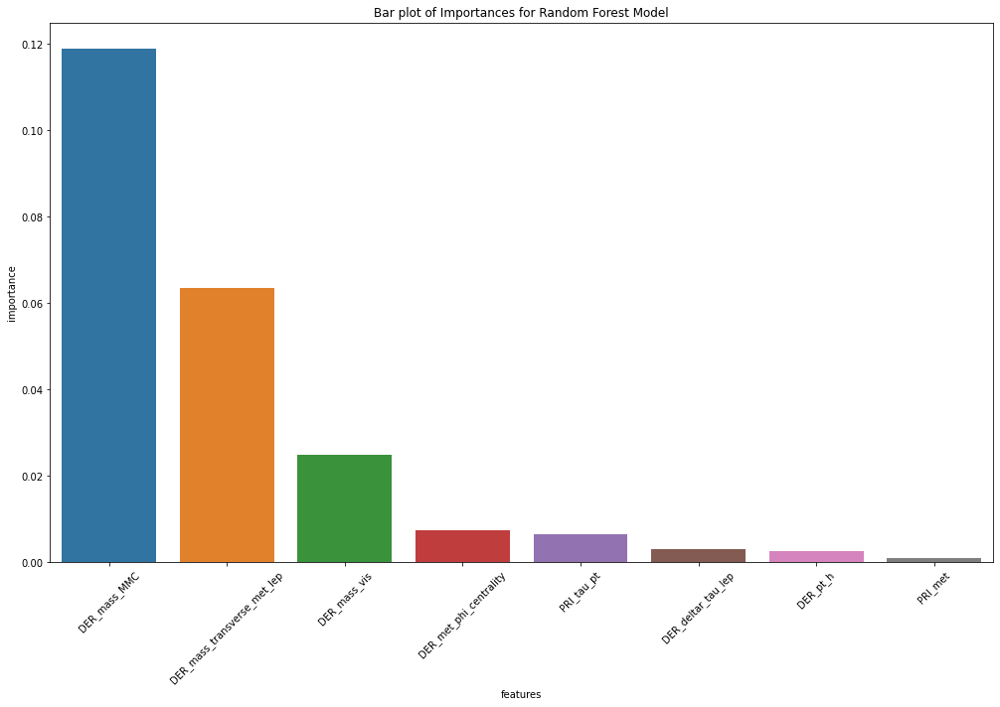

In [ ]:

rimp=permutation_importance(clf2,Xtest,ytest)
rdf=p_importance(clf2,features,rimp['importances_mean'],rimp['importances_std'])
fig,ax=plt.subplots(figsize=(17,10))
sns.barplot(data=rdf,x='features',y='importance',label='RandomForest_importances',ax=ax)
plt.xticks(rotation='45')
plt.title("Bar plot of Importances for Random Forest Model");

Since, we know this is an imbalanced dataset, we will try out an upsampling downsampling for this purpose and run our model on the balanced dataset, to see how well our model does and if the upsampling helps.

SCORE FUNC roc_auc
BEST {'max_depth': 5, 'max_features': 3, 'n_estimators': 400} 0.884236932163678
############# based on standard predict ################
Accuracy on training data: 0.80
Accuracy on test data:     0.80
[[26836  5965]
 [ 7198 25735]]
########################################################


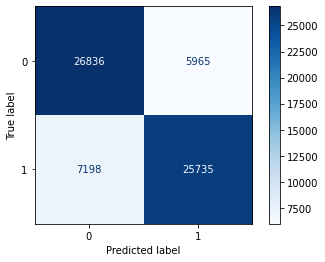

In [ ]:
clf2=RandomForestClassifier(random_state=2017)
parameters={"n_estimators":[400],'max_features':[3],'max_depth':[5]}
clf2, Xtrain, ytrain, Xtest, ytest  = do_classify(clf2, 
   parameters,X[features],y,"roc_auc", n_folds=5, n_jobs=1)


In [ ]:
print(classification_report(ytest,clf2.predict(Xtest)))

              precision    recall  f1-score   support

           0       0.79      0.82      0.80     32801
           1       0.81      0.78      0.80     32933

    accuracy                           0.80     65734
   macro avg       0.80      0.80      0.80     65734
weighted avg       0.80      0.80      0.80     65734



### Boosting:

### Boosting without Balancing Dataset:

In [ ]:
Xtrain,Xtest,ytrain,ytest=train_test_split(train_dataX[features],train_dataY,train_size=0.8)
Xtrain.shape,ytrain.shape
dtrainimb=xgb.DMatrix(Xtrain,label=ytrain)

clf3 = xgb.train(xgb_pars, dtrainimb, 500,
                  maximize=False, verbose_eval=15) 


In [ ]:
dvalid = xgb.DMatrix(Xtest, label=ytest)
y_predimb=clf3.predict(dvalid)
y_predimb_=[1 if y>0.5 else 0 for y in y_predimb]
print(classification_report(ytest,y_predimb_))

### Boosting with the Balanced Data:

In [ ]:
Xtrain,Xtest,ytrain,ytest=train_test_split(X[features],y,train_size=0.8)
Xtrain.shape,ytrain.shape

((262932, 8), (262932,))

In [ ]:
dtrain = xgb.DMatrix(Xtrain, label=ytrain)
dvalid = xgb.DMatrix(Xtest, label=ytest)

xgb_pars = {'min_child_weight': 100, 'eta': 0.04, 'colsample_bytree': 0.8, 'max_depth': 100,
             'subsample': 0.75, 'lambda': 2, 'nthread': -1, 'booster' : 'gbtree', 'silent': 1, 'gamma' : 0,
             'eval_metric': 'mae', 'objective': 'reg:linear'}    

clf3 = xgb.train(xgb_pars, dtrain, 500,
                  maximize=False, verbose_eval=15) 

[16:55:27] WARNING: ../src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[16:55:27] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




In [ ]:
y_pred=clf3.predict(dvalid)

In [ ]:
y_pred_=[1 if y>0.5 else 0 for y in y_pred]

In [ ]:
print(classification_report(ytest,y_pred_))

              precision    recall  f1-score   support

           0       0.84      0.85      0.84     33111
           1       0.85      0.83      0.84     32623

    accuracy                           0.84     65734
   macro avg       0.84      0.84      0.84     65734
weighted avg       0.84      0.84      0.84     65734



*Without the balancing of the dataset, the model runs poorly and hence the balancing.*

# Comparing the ROC curves:

In [ ]:

def make_roc(name, clf, ytest, xtest, ax=None, labe=5,  proba=True, skip=0, initial = False):
    if not ax:
        ax=plt.gca()
    if proba:
        fpr, tpr, thresholds=roc_curve(ytest, clf.predict_proba(xtest)[:,1])
    else:
        fpr, tpr, thresholds=roc_curve(ytest, clf.decision_function(xtest))
    roc_auc = auc(fpr, tpr)
    if skip:
        l=fpr.shape[0]
        ax.plot(fpr[0:l:skip], tpr[0:l:skip], '.-', lw=2, alpha=0.4, label='ROC curve for %s (area = %0.2f)' % (name, roc_auc))
    else:
        ax.plot(fpr, tpr, '.-', lw=2, alpha=0.4, label='ROC curve for %s (area = %0.2f)' % (name, roc_auc))
    label_kwargs = {}
    label_kwargs['bbox'] = dict(
        boxstyle='round,pad=0.3', alpha=0.2,
    )
    for k in range(0, fpr.shape[0],labe):
        #from https://gist.github.com/podshumok/c1d1c9394335d86255b8
        threshold = str(np.round(thresholds[k], 2))
        ax.annotate(threshold, (fpr[k], tpr[k]), **label_kwargs)
    if initial:
        ax.plot([0, 1], [0, 1], 'k--')
        ax.set_xlim([0.0, 1.0])
        ax.set_ylim([0.0, 1.05])
        ax.set_xlabel('False Positive Rate')
        ax.set_ylabel('True Positive Rate')
        ax.set_title('ROC')
    ax.legend(loc="lower right")
    return ax

<AxesSubplot:>

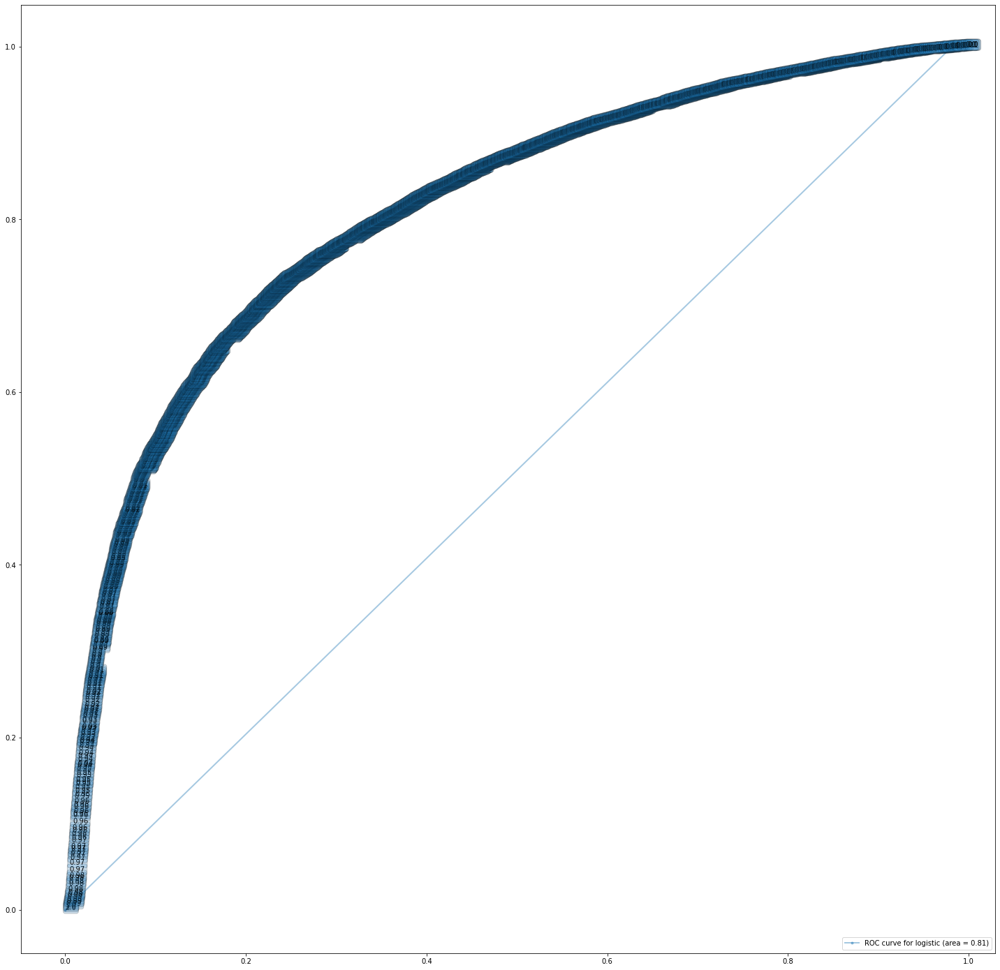

In [ ]:
fig,ax=plt.subplots(figsize=(25,25))
xtrain,xtest,ytr,yte=train_test_split(train_dataX,train_dataY,train_size=0.8)
make_roc('logistic', lr,yte ,xtest, ax=ax, labe=10,  proba=True, skip=16300, initial = False)



<AxesSubplot:>

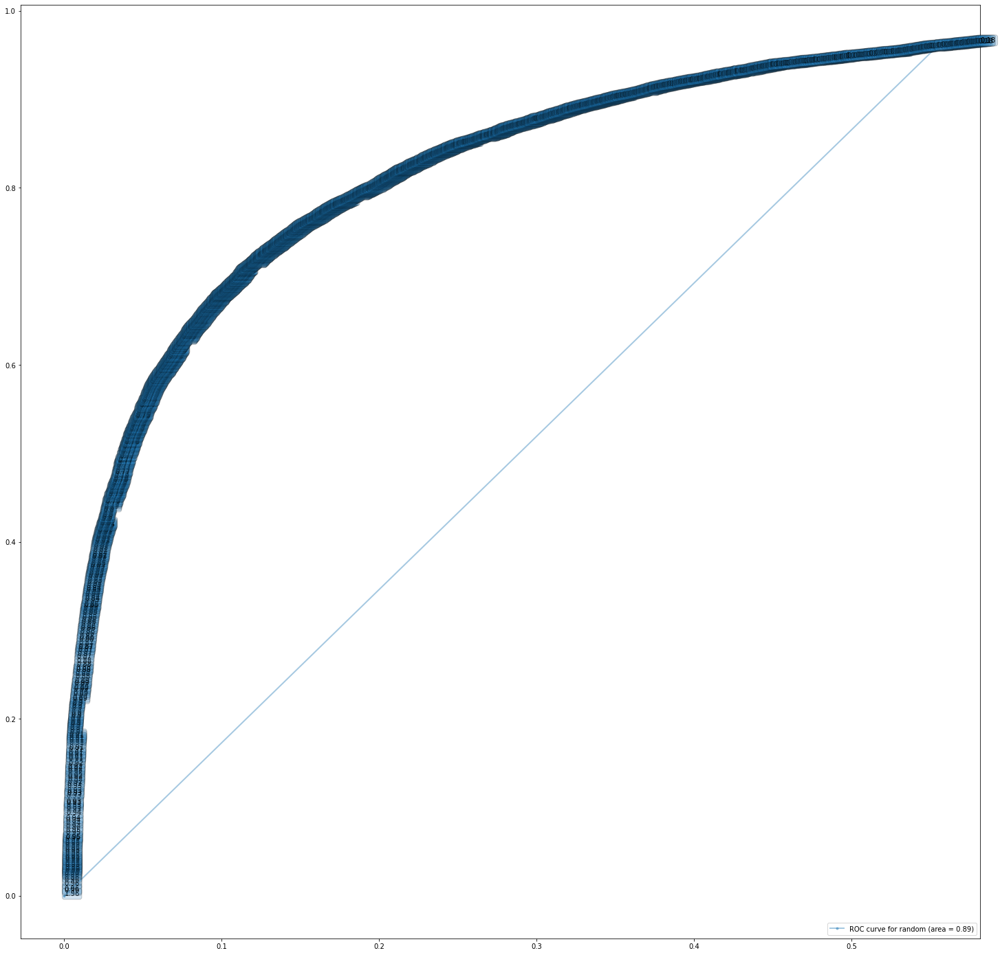

In [ ]:
fig,ax=plt.subplots(figsize=(25,25))
make_roc('random', clf2,ytest ,Xtest, ax=ax, labe=10,  proba=True, skip=16300, initial = False)

<AxesSubplot:>

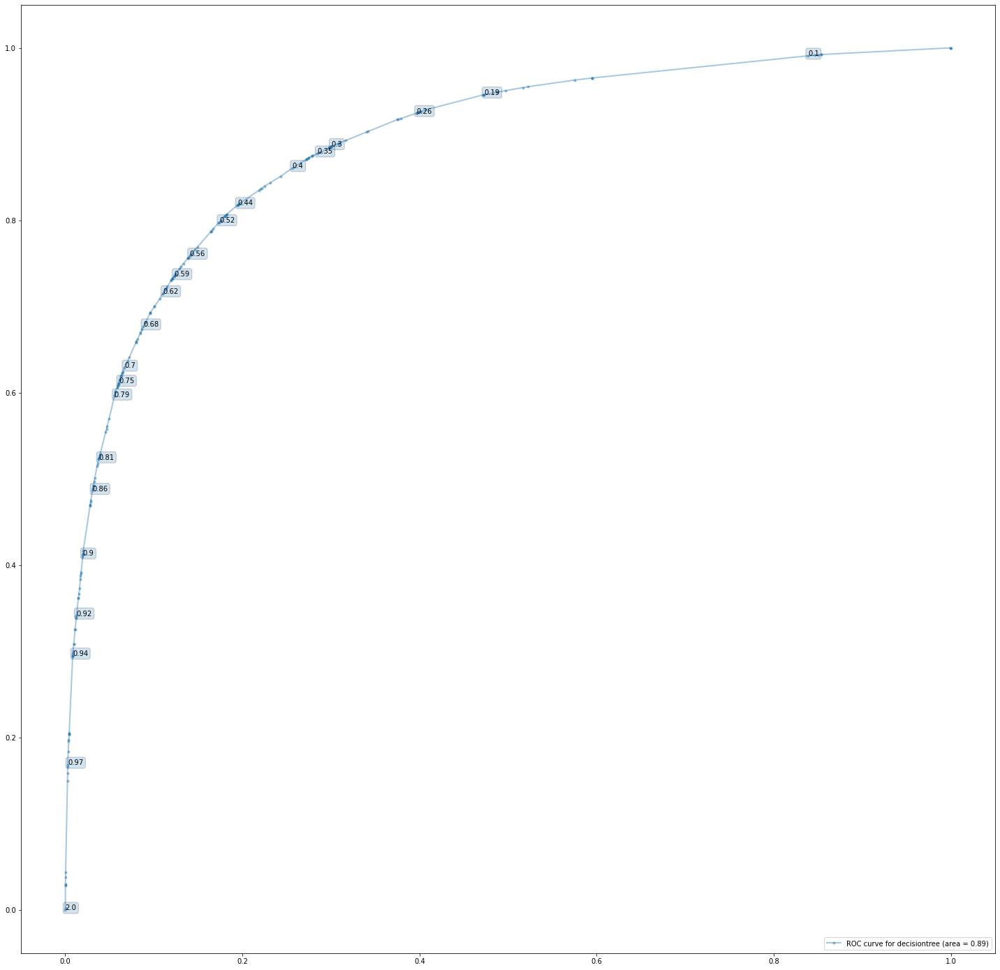

In [ ]:
fig,ax=plt.subplots(figsize=(25,25))
make_roc('decisiontree', clf,ytest ,Xtest, ax=ax, labe=10,  proba=True, skip=0, initial = False)

**The ** 